In [3]:
import h5py
import numpy as np
from netCDF4 import Dataset
import pandas as pd
from pyproj import Proj, CRS, transform
import matplotlib
import sys
sys.path.append('/home/ZhiLi/CRESTHH')
from cresthh.utils import flowAreaCalc as flow_area
from cresthh.utils import processSWW
from cresthh.anuga import SWW_plotter
from cresthh.anuga.utilities import sww_merge
from cresthh.anuga.shallow_water.forcing import Cross_section
from cresthh import metrics as met
%matplotlib inline
import geopandas as gpd
# Allow inline jshtml animations
from matplotlib import rc
rc('animation', html='jshtml')

In [4]:
from functools import partial
from multiprocessing import Pool
def getIndex(lons_smap,lats_smap, args):
    global utm
    lon, lat=args
    lons_utm,lats_utm= utm(lons_smap, lats_smap)

    row,col= np.where(((lons_utm-lon)**2+(lats_utm-lat)**2)==np.nanmin((lons_utm-lon)**2+(lats_utm-lat)**2))
    print(row,col)
#     col= np.where(abs(lons_utm[0,:] - lon)== np.nanmin(abs(lons_utm[0,:] - lon)))[0]
#     row= np.where(abs(lats_utm[:,0] - lat) == np.nanmin(abs(lats_utm[:,0] - lat)))[0]
                  
    return row, col

def thread(dates, lons, lats):
    global utm
    values=[]
    for time in dates:
        try:  
            fname= '/media/scratch/ZhiLi/SMAP/SMAP_L3_SM_P_E_%s_R16510_001.h5'%time.strftime('%Y%m%d')
            with h5py.File(fname, 'r') as h5:
                soil= h5['Soil_Moisture_Retrieval_Data_AM/soil_moisture'][:]
                lons= h5['Soil_Moisture_Retrieval_Data_AM/longitude'][:]
                lats= h5['Soil_Moisture_Retrieval_Data_AM/latitude'][:]

            rows, cols= getIndex(lons, lats, lons, lats)
            vals= soil[rows, cols]

        except OSError:
            vals= np.nan
        values.append(vals)
    return values

def SMAPretrieval(lons, lats, periods):

        
    df= pd.DataFrame(index= periods, columns=['smap'])
#     dr= pd.date_range('20170826060000', '20170830060000', freq='1D')
    func= partial(thread, periods)
    pool= Pool(24)
    results= pool.map(func, zip(lons,lats))
    pool.close()
    for result in results:
        df.loc[result[0], 'smap']= result[1]
        
    return df

In [13]:
splotter= SWW_plotter('coupled_opt.sww', start_time=pd.to_datetime('20170825120000'))

Figure files for each frame will be stored in _plot


In [6]:
xc= splotter.xc+ splotter.xllcorner
yc= splotter.yc+ splotter.yllcorner

In [5]:
utm= Proj("EPSG:32215")

In [6]:
dr= pd.date_range('20170826060000', '20170830060000', freq='1D')

In [7]:
smap_am= np.zeros((5,len(xc)))

In [12]:
results= thread(dr, xc, yc)

In [ ]:
time=pd.to_datetime('20170826060000')
fname= '/media/scratch/ZhiLi/SMAP/SMAP_L3_SM_P_E_%s_R16510_001.h5'%time.strftime('%Y%m%d')
with h5py.File(fname, 'r') as h5:
    soil= h5['Soil_Moisture_Retrieval_Data_AM/soil_moisture'][:]
    lons= h5['Soil_Moisture_Retrieval_Data_AM/longitude'][:]
    lats= h5['Soil_Moisture_Retrieval_Data_AM/latitude'][:]
func= partial(getIndex, lons, lats)
pool= Pool(40)
rows, cols= pool.map(func, zip(xc, yc))
pool.close()

(array([409]), array([947]))
(array([409]), array([947]))
(array([409]), array([947]))
(array([409]), array([947]))
(array([409]), array([947]))
(array([415]), array([946]))
(array([415]), array([946]))
(array([415]), array([946]))
(array([415]), array([946]))
(array([415]), array([946]))
(array([415]), array([946]))
(array([415]), array([946]))
(array([409]), array([947]))
(array([415]), array([946]))
(array([415]), array([946]))
(array([415]), array([946]))
(array([409]), array([947]))
(array([409]), array([947]))
(array([415]), array([946]))
(array([415]), array([946]))
(array([415]), array([946]))
(array([415]), array([946]))
(array([409]), array([947]))
(array([409]), array([947]))
(array([409]), array([947]))
(array([415]), array([946]))
(array([415]), array([946]))
(array([415]), array([946]))
(array([409]), array([947]))
(array([415]), array([946]))
(array([409]), array([947]))
(array([415]), array([946]))
(array([415]), array([946]))
(array([409]), array([947]))
(array([409]),

In [ ]:
for time in dr[:1]:
    fname= '/media/scratch/ZhiLi/SMAP/SMAP_L3_SM_P_E_%s_R16510_001.h5'%time.strftime('%Y%m%d')
    with h5py.File(fname, 'r') as h5:
        soil= h5['Soil_Moisture_Retrieval_Data_AM/soil_moisture'][:]
        lons= h5['Soil_Moisture_Retrieval_Data_AM/longitude'][:]
        lats= h5['Soil_Moisture_Retrieval_Data_AM/latitude'][:]
    func= partial(getIndex, lons, lats)
    pool= Pool(30)
    rows, cols= pool.map(func, zip(xc, yc))
    pool.close()
#     vals= soil[rows, cols]

In [10]:
splotter.save_soil_frame?

Signature: splotter.save_soil_frame(figsize=(10, 6), dpi=160, frame=-1, vmin=0.0, vmax=100.0)
Docstring: <no docstring>
File:      ~/CRESTHH/cresthh/anuga/utilities/animate.py
Type:      instancemethod


In [14]:
for i, time in enumerate(splotter.time):
#     print time
    if i%30==0:
        splotter.save_soil_frame(frame=i,  dpi=80, vmin=0, vmax=100)
    else:
        pass
#         splotter.save_depth_frame(frame=i, cmap='Blues', vmin=0, vmax=10, dpi=80)
        

In [39]:
np.argmin(splotter.SM[-1,:])

61257

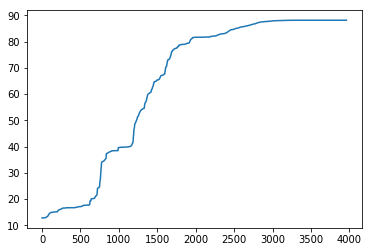

In [40]:
plt.plot(splotter.SM[:,61257])

In [15]:
splotter.make_soil_animation()

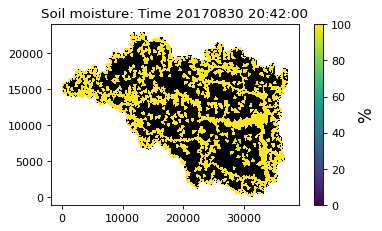

In [7]:
splotter.plot_soil_frame(frame=-100,vmin=0, vmax=100)